# **Тематическое моделирование сообщений с форума Reddit с помощью библиотеки BERTopic**

Этот проект позволяет:

1. Получить данные из Reddit
2. Очистить полученные данные
3. Извлечь главные обсуждаемые темы из обсуждений
4. Сохранить результат в формате csv

Проект можно подстраивать под другие источники информации, что позволяет проводить разные эксперименты.

## Загрузка данных из Reddit:

Извлекаемые данные - комментарии пользователей, поэтому в подробном обзоре не нуждаются.

### Импорт библиотек:

In [1]:
import praw
from datetime import datetime
import configparser
import time
from tqdm import tqdm

### Инициализация Reddit API:

In [2]:
config = configparser.ConfigParser()
config.read("config.ini")

['config.ini']

In [3]:
reddit = praw.Reddit(
    client_id=config.get("reddit", "client_id"),
    client_secret=config.get("reddit", "client_secret"),
    user_agent=config.get("reddit", "user_agent"),
    check_for_async=False,
)

Version 7.8.0 of praw is outdated. Version 7.8.1 was released 2 days ago.


### Выбор ветки форума:

In [4]:
subreddit = reddit.subreddit("politics")

### Загрузка комментариев из самых обсуждаемых тем за день:

In [5]:
comms = []

# Получаем список самых обсуждаемых тем за день
hot_submissions = subreddit.hot(limit=75)

# Проходим по всем обсуждаемым темам
for submission in tqdm(hot_submissions):
    # Проверяем, что тема была создана за последние 24 часа
    if submission.created_utc > time.time() - 24 * 60 * 60:
        submission.comments.replace_more(
            limit=0
        )  # Загружаем только те комментарии, которые алгоритмы Reddit считают самыми важными
        for comment in submission.comments.list():
            comms.append(comment.body)

0it [00:00, ?it/s]

75it [01:27,  1.17s/it]


### Вывод первых результатов:

Видно, что в данных присутствуют html элементы, специальные символы и прочий шум. Поэтому, нужно провести очистку данных. 

In [6]:
comms[:20]

["To sort this thread by 'best comments first', [click or tap here](https://www.reddit.com/r/politics/comments/1gda4zc/rpolitics_2024_us_elections_live_thread_part_53/?sort=confidence).\n\nTo sort this thread by 'newest comments first', [click or tap here](https://www.reddit.com/r/politics/comments/1gda4zc/rpolitics_2024_us_elections_live_thread_part_53/?sort=new).",
 'Billionaire LA Times owner Dr. Patrick Soon-Shiong, who decided the paper would not publish its endorsement in the presidential election, paid no federal income tax for 5 consecutive years, @propublica found in 2021.\n\nI viscerally hate these people.',
 'I wanna shout out my Auntie Chitra in Wake County, NC who\'s an early voting poll greeter right now. She\'s been canvassing her face off for Dems, calling everyone she knows to explain the ballot and voting procedures, and generally being the benevolent tyrant that all Indian aunties can blossom into being. She\'s also given her first local rally speech and shared her f

In [7]:
len(comms)

11230

## Предобработка текста:

### Импорт библиотек:

In [8]:
import spacy
import re

Отключим ненужные шаги в пайплайне spaCy.

In [9]:
# Словари:
# en_core_web_sm
# en_core_web_trf

nlp = spacy.load(
    "en_core_web_sm",
    exclude=["tok2vec", "tagger", "parser", "attribute_ruler", "lemmatizer", "ner"],
)

### Функция очистки текста от html элементов с помощью Regex:

In [10]:
def regex_preprocessing(text):
    text = re.sub(
        r"http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+",
        " ",
        text,
    )
    text = re.sub(
        r"\n|\r|\<.*?\>|\{.*?\}|\[.*?\]|u/|\(.*emote.*\)|\[gif\]|_", " ", text
    )
    text = re.sub(r"[^\w0-9'’“”%]", " ", text)
    return text

### Функция для подготовки текста к моделированию:

BERTopic использует трансформеры. Модель лучше обучается, если получает большую информацию из текста. Поэтому, предобработка минимальная.

In [11]:
def tokenizer_preprocessing(text_list):
    texts = []
    for text in text_list:
        doc = nlp(text)
        tokens = [token.text.lower() for token in doc]
        tokens = " ".join(tokens)
        tokens = tokens.split()
        tokens = [token for token in tokens if not token.isspace()]
        tokens = [token for token in tokens if token != ""]
        tokens = " ".join(tokens)
        texts.append(tokens)
    return texts

### Удалим дубликаты и документы, в которых меньше четырех слов:

In [12]:
import pandas as pd

In [13]:
comms_data = pd.DataFrame(data=comms, columns=["comments"]).drop_duplicates(
    subset="comments", keep=False
)
comms_data = comms_data[comms_data["comments"].str.split().str.len() > 4]

In [14]:
comms_data["comments"].to_list()[:10]

["To sort this thread by 'best comments first', [click or tap here](https://www.reddit.com/r/politics/comments/1gda4zc/rpolitics_2024_us_elections_live_thread_part_53/?sort=confidence).\n\nTo sort this thread by 'newest comments first', [click or tap here](https://www.reddit.com/r/politics/comments/1gda4zc/rpolitics_2024_us_elections_live_thread_part_53/?sort=new).",
 'Billionaire LA Times owner Dr. Patrick Soon-Shiong, who decided the paper would not publish its endorsement in the presidential election, paid no federal income tax for 5 consecutive years, @propublica found in 2021.\n\nI viscerally hate these people.',
 'I wanna shout out my Auntie Chitra in Wake County, NC who\'s an early voting poll greeter right now. She\'s been canvassing her face off for Dems, calling everyone she knows to explain the ballot and voting procedures, and generally being the benevolent tyrant that all Indian aunties can blossom into being. She\'s also given her first local rally speech and shared her f

### Применим функции для предобработки текста для BERTopic:

In [15]:
clean_data = comms_data["comments"].apply(regex_preprocessing).to_list()
clean_data[:10]

["To sort this thread by 'best comments first'       To sort this thread by 'newest comments first'     ",
 'Billionaire LA Times owner Dr  Patrick Soon Shiong  who decided the paper would not publish its endorsement in the presidential election  paid no federal income tax for 5 consecutive years   propublica found in 2021   I viscerally hate these people ',
 "I wanna shout out my Auntie Chitra in Wake County  NC who's an early voting poll greeter right now  She's been canvassing her face off for Dems  calling everyone she knows to explain the ballot and voting procedures  and generally being the benevolent tyrant that all Indian aunties can blossom into being  She's also given her first local rally speech and shared her friend's special recipe for preventing yard sign theft   Smear the edges of the sign and the back with a mixture of Vaseline  oil  turmeric  and the VERY HOT red chili powder from the Indian store              Chitra has lived here for 40 years and her auntie friends h

In [16]:
clean_data = tokenizer_preprocessing(clean_data)
clean_data[:10]

["to sort this thread by ' best comments first ' to sort this thread by ' newest comments first '",
 'billionaire la times owner dr patrick soon shiong who decided the paper would not publish its endorsement in the presidential election paid no federal income tax for 5 consecutive years propublica found in 2021 i viscerally hate these people',
 "i wanna shout out my auntie chitra in wake county nc who 's an early voting poll greeter right now she 's been canvassing her face off for dems calling everyone she knows to explain the ballot and voting procedures and generally being the benevolent tyrant that all indian aunties can blossom into being she 's also given her first local rally speech and shared her friend 's special recipe for preventing yard sign theft smear the edges of the sign and the back with a mixture of vaseline oil turmeric and the very hot red chili powder from the indian store chitra has lived here for 40 years and her auntie friends have been involved in local organiz

In [17]:
len(clean_data)

10118

### Повторно проверим длину строк и наличие дубликатов после очистки:

In [18]:
clean_data_df = pd.DataFrame(data=clean_data, columns=["comments"]).drop_duplicates(
    subset="comments", keep=False
)
clean_data_df = clean_data_df[clean_data_df["comments"].str.split().str.len() > 4]

In [19]:
clean_data = clean_data_df["comments"].to_list()

### Итоговый список комментариев:

In [20]:
clean_data[:10]

["to sort this thread by ' best comments first ' to sort this thread by ' newest comments first '",
 'billionaire la times owner dr patrick soon shiong who decided the paper would not publish its endorsement in the presidential election paid no federal income tax for 5 consecutive years propublica found in 2021 i viscerally hate these people',
 "i wanna shout out my auntie chitra in wake county nc who 's an early voting poll greeter right now she 's been canvassing her face off for dems calling everyone she knows to explain the ballot and voting procedures and generally being the benevolent tyrant that all indian aunties can blossom into being she 's also given her first local rally speech and shared her friend 's special recipe for preventing yard sign theft smear the edges of the sign and the back with a mixture of vaseline oil turmeric and the very hot red chili powder from the indian store chitra has lived here for 40 years and her auntie friends have been involved in local organiz

In [21]:
len(clean_data)

10080

## BERTopic:

Для извлечения тем используем бибилотеку BERTopic, которая проводит тематическое моделирование с помощью кластеризации векторных представлений документов. Главные отличия BERTopic от других тематических моделей:

1. Высокая скорость работы благодаря уменьшению размерности векторных представлений.
2. Модульная структура пайплайна модели: этапы векторизации, уменьшения размерности и кластеризации отделены друг от друга, что позволяет легко и быстро экспериментировать с разными комбинациями настроек алгоритмов.
3. Пайплайн модели состоит из SOTA инструментов: SBERT, UMAP, HDBSCAN. В совокупности, это позволяет получить наилучшие результаты, по сравнению с другими моделями.
 

### Импорт библиотек:

In [22]:
from bertopic import BERTopic
from bertopic.representation import MaximalMarginalRelevance

### Настройка пайплайна BERTopic:

#### Векторное представление текстов:

Модель gte-small была выбрана с помощью бенчмарка от Hugging Face. Легкая, хорошо работает с данными из Reddit.

In [23]:
from sentence_transformers import SentenceTransformer

# Pre-calculate embeddings
embedding_model = SentenceTransformer(
    model_name_or_path="thenlper/gte-small",
    cache_folder="transformers_cache",
)
embeddings = embedding_model.encode(clean_data, show_progress_bar=True)

Batches:   0%|          | 0/315 [00:00<?, ?it/s]

#### Уменьшим размерность векторов с помощью Uniform Manifold Approximation and Projection (UMAP):

In [33]:
# from umap import UMAP
from cuml import UMAP

#### Визуализация применения UMAP для наших данных:

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set_theme(style="darkgrid")
%config InlineBackend.figure_format = "retina"

10it [00:01,  5.36it/s]


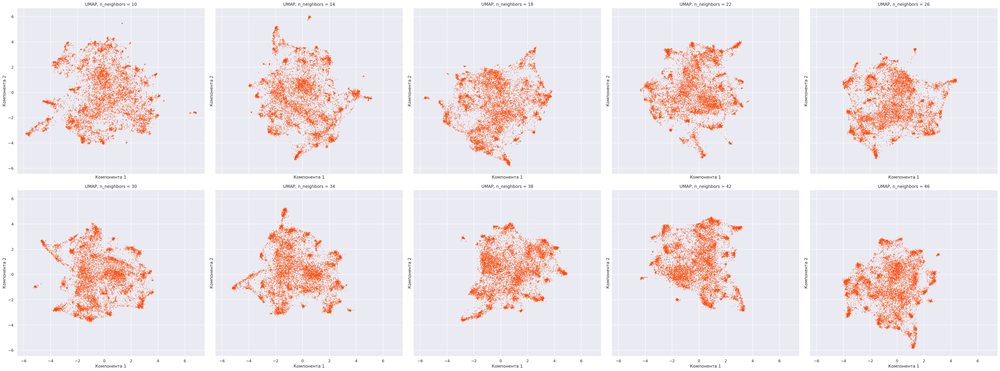

In [51]:
neighbors_list = np.arange(10, 50, 4)
fig, axes = plt.subplots(2, 5, figsize=(40, 15), sharex=True, sharey=True)

axes = axes.flatten()
for ax, neighbors in tqdm(zip(axes, neighbors_list)):
    umap_model = UMAP(
        n_neighbors=neighbors,
        n_components=2,
        min_dist=0.0,
        metric="cosine",
        random_state=100,
    )
    # Применяем UMAP к данным
    umap_result = umap_model.fit_transform(embeddings)
    # Визуализируем результаты
    ax.scatter(umap_result[:, 0], umap_result[:, 1], alpha=0.4, c="orangered", s=2)
    ax.set_title(f"UMAP, n_neighbors = {neighbors}")
    ax.set_xlabel("Компонента 1")
    ax.set_ylabel("Компонента 2")

plt.tight_layout()
plt.show()

#### Разобьем данные на кластеры с помощью HDBSCAN:

In [56]:
from hdbscan import HDBSCAN
# from cuml.cluster.hdbscan import HDBSCAN

#### Покажем результаты кластеризации:

In [36]:
# Уменьшим размерность с помощью UMAP
umap_model = UMAP(
    n_neighbors=15,
    n_components=2,
    min_dist=0.0,
    metric="cosine",
    random_state=100,
)
umap_result = umap_model.fit_transform(embeddings)

10it [00:03,  2.72it/s]


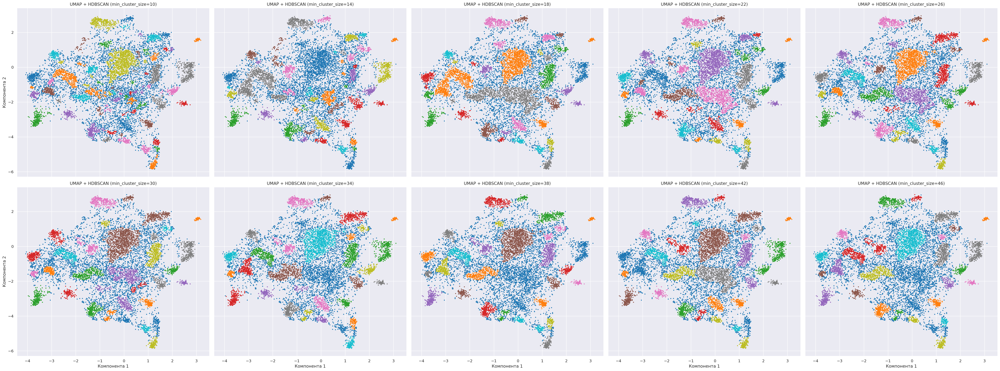

In [57]:
sizes = np.arange(10, 50, 4)
fig, axes = plt.subplots(2, 5, figsize=(40, 15), sharex=True, sharey=True)

axes = axes.flatten()
for ax, size in tqdm(zip(axes, sizes)):
    # Кластеризуем данные с помощью HDBSCAN
    hdbscan_model = HDBSCAN(
        min_cluster_size=size, metric="euclidean", prediction_data=True
    )
    hdbscan_labels = hdbscan_model.fit_predict(umap_result)
    # Создадим DataFrame с результатами UMAP и метками HDBSCAN
    df = pd.DataFrame(umap_result, columns=[f"UMAP{i+1}" for i in range(0, 2, 1)])
    df["Cluster"] = hdbscan_labels
    # Рассеянная диаграмма для результатов UMAP
    sns.scatterplot(
        x="UMAP1",
        y="UMAP2",
        hue="Cluster",
        data=df,
        palette="tab10",
        legend=None,
        linewidth=0,
        s=8,
        ax=ax,
    ).set_title(f"UMAP + HDBSCAN (min_cluster_size={size})")
    ax.set_xlabel("Компонента 1")
    ax.set_ylabel("Компонента 2")

plt.tight_layout()
plt.show()

#### Подставим выбранные гипермараметры для UMAP и HDBSCAN:

Гиперпараметры выбраны с учетом целей:

1. Cохранить локальную структуру данных после уменьшения размерности данных, UMAP
2. Уменьшить количество шума в кластерах, HDBSCAN
3. Создать список понятных тем на выходе

In [59]:
umap_model = UMAP(
    n_neighbors=15,
    n_components=5,
    min_dist=0.0,
    metric="cosine",
    random_state=100,
)
hdbscan_model = HDBSCAN(min_cluster_size=15, metric="euclidean", prediction_data=True)

#### Удалим стоп-слова после распределения текстов по темам:

In [60]:
spacy_stopwords = spacy.lang.en.stop_words.STOP_WORDS

In [61]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer_model = CountVectorizer(
    stop_words=list(spacy_stopwords), min_df=0.03, max_df=0.99, ngram_range=(1, 2)
)

#### Запустим пайплайн и обучим модель:

Модель MaximalMarginalRelevance изменяет порядок слов в темах, чтобы убрать смысловые повторения и составить последовательность из самых значимых слов.

In [62]:
# Создаем модель BERTopic
representation_model = MaximalMarginalRelevance()
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    representation_model=representation_model,
    language="english",
    verbose=True,
    nr_topics="auto",
)

# Обучаем модель
topics, probs = topic_model.fit_transform(clean_data, embeddings)

# Получаем темы
topic_representation = topic_model.get_topic_info()

2024-10-28 05:50:08,487 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-10-28 05:50:08,975 - BERTopic - Dimensionality - Completed ✓
2024-10-28 05:50:08,976 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-10-28 05:50:09,628 - BERTopic - Cluster - Completed ✓
2024-10-28 05:50:09,630 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-10-28 05:50:12,020 - BERTopic - Representation - Completed ✓
2024-10-28 05:50:12,023 - BERTopic - Topic reduction - Reducing number of topics
2024-10-28 05:50:14,590 - BERTopic - Topic reduction - Reduced number of topics from 38 to 33


### Темы:

#### Выведем список тем:

In [63]:
topic_representation["Name"].to_list()

['-1_trump_like_vote_harris',
 '0_people_rally_stupid_know',
 '1_vote vote_vote_maga_election',
 '2_bezos_amazon_wapo_cancel',
 '3_comedian_tony_comedy_jokes',
 '4_puerto_rico_puerto rico_puerto ricans',
 '5_nazi_rally_nazi rally_hitler',
 '6_gaza_palestine_vote_palestinians',
 '7_immigrants_illegal_immigration_illegal immigrants',
 '8_god_christian_antichrist_christ',
 '9_putin_russia_china_eu',
 '10_lauren_district_boebert_colorado',
 '11_biden_taliban_trump_camp david',
 '12_rich_billionaires_billionaire_wealth',
 '13_military_trump_use military_veterans',
 '14_citizenship_deport_student visa_south africa',
 '15_musk_elon musk_spacex_trump',
 '16_000_abortion_states_abortions',
 '17_vote_vote kamala_candidate_voting kamala',
 '18_bunny_bad bunny_taylor swift_latino',
 '19_racist_white_racism_race ethnicity',
 '20_vance_jake tapper_trump_vance vance',
 '21_coach_nba_popovich_coaches',
 '22_weed_cannabis_legalization_idaho',
 '23_voting booth_vote secret_husbands voting_wives vote',
 

#### Покажем темы на графиках:

In [64]:
import plotly.io as pio

pio.renderers.default = "notebook+vscode+jupyterlab"

In [65]:
topic_model.visualize_topics()

In [66]:
hierarchical_topics = topic_model.hierarchical_topics(clean_data)

100%|██████████| 31/31 [00:02<00:00, 15.19it/s]


In [67]:
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

In [68]:
tree = topic_model.get_topic_tree(hierarchical_topics)

In [69]:
print(tree)

.
├─trump_vote_vote vote_biden_election
│    ├─musk_immigrants_immigration_deport_deportation
│    │    ├─■──elon_government grants_extortion_criminal_violating ── Topic: 27
│    │    └─musk_immigrants_immigration_deport_deportation
│    │         ├─musk_immigrants_deportation_illegal immigrants_mass deportation
│    │         │    ├─■──musk_elon musk_spacex_trump_tax ── Topic: 15
│    │         │    └─■──immigrants_illegal_immigration_illegal immigrants_mass deportation ── Topic: 7
│    │         └─■──citizenship_deport_student visa_south africa_deported ── Topic: 14
│    └─trump_vote_vote vote_like_biden
│         ├─trump_vote_vote vote_biden_bezos
│         │    ├─bezos_amazon_putin_trump_wapo
│         │    │    ├─bezos_amazon_wapo_billionaires_journalism
│         │    │    │    ├─■──rich_billionaires_billionaire_wealth_money ── Topic: 12
│         │    │    │    └─■──bezos_amazon_wapo_cancel_endorsement ── Topic: 2
│         │    │    └─military_putin_russia_trump_america
│      

## Сохраним результат моделирования за день в формате csv:

#### Создадим датафрейм с данными:

In [70]:
topics_bert = topic_representation["Name"].to_list()

# Получим текущую дату и время
now = datetime.now()
# Преобразуем их в строку в формате YYYYMMDD
date_str = now.strftime("%Y_%m_%d")

df_bert = pd.DataFrame(
    data=topic_model.generate_topic_labels(nr_words=None, topic_prefix=False),
    columns=["topics"],
)
df_bert["date"] = date_str
df_bert["size"] = df_bert.index
df_bert = df_bert[["date", "size", "topics"]]

In [71]:
def clean_df_bert(df):
    df = re.sub(r"_", ",", df)
    return df

In [72]:
df_bert["topics"] = df_bert["topics"].apply(clean_df_bert)
print(df_bert)

          date  size                                             topics
0   2024_10_28     0  trump,like,vote,harris,election,voting,good,pr...
1   2024_10_28     1  people,rally,stupid,know,age,crowd,msg,reality...
2   2024_10_28     2  vote vote,vote,maga,election,republicans,fasci...
3   2024_10_28     3  bezos,amazon,wapo,cancel,endorsement,trump,new...
4   2024_10_28     4  comedian,tony,comedy,jokes,racist,rogan,comedi...
5   2024_10_28     5  puerto,rico,puerto rico,puerto ricans,ricans,p...
6   2024_10_28     6  nazi,rally,nazi rally,hitler,nazis,madison squ...
7   2024_10_28     7  gaza,palestine,vote,palestinians,netanyahu,vot...
8   2024_10_28     8  immigrants,illegal,immigration,illegal immigra...
9   2024_10_28     9  god,christian,antichrist,christ,religion,chris...
10  2024_10_28    10  putin,russia,china,eu,nato,ukraine,trump,count...
11  2024_10_28    11  lauren,district,boebert,colorado,vote,won,denv...
12  2024_10_28    12  biden,taliban,trump,camp david,afghan,bide

In [73]:
def save_dataframe(df):
    # Получим текущую дату и время
    now = datetime.now()

    # Преобразуем их в строку в формате YYYYMMDD
    date_str = now.strftime("%Y_%m_%d")

    # Сохраним DataFrame в CSV-файл с текущей датой в имени файла
    df.to_csv(
        f"hot_csvs/{subreddit.display_name}_topics_{date_str}.csv",
        index=False,
    )

In [74]:
save_dataframe(df_bert)

### Сохраним исходные данные в формате csv:

In [75]:
import csv

In [76]:
data_list = []
for doc in clean_data:
    doc = [doc]
    data_list.append(doc)

In [77]:
fields = date_str
rows = data_list

with open(
    f"hot_csvs/original_data/{subreddit.display_name}_data_{date_str}.csv", "w"
) as f:
    write = csv.writer(f)
    write.writerow(fields)
    write.writerows(rows)

## Выводы

Был построен алгоритм, который собирает данные из открытого источника информации - раздела Politics из форума Reddit, затем извлекает самые обсуждаемые темы с помощью модели BERTopic. С небольшими доработками, можно превратить этот ноутбук в скрипт, который будет запускаться по расписанию и собирать данные. Когда накопиться требуемый обьем данных - можно проводить новые исследования. Например, динамическое тематическое моделирование с целью исследования изменения трендов в обсуждениях со временем.

В работе не представлены метрики для оценки качества модели, т.к. отсутсвие надежных метрик - одна из актуальных проблем в области тематического моделирования. Наилучший результат, который подвержен субьективности, достигается с помощью перебора разных параметров модели. По этой причине, BERTopic выгодно отличается от других решений, т.к. с каждым алгоритмом в модели можно экспериментировать отдельно и не проводить каждый раз полное моделирование. В целом, этот проект направлен на дальнейшую автоматизацию и требует тематическую модель, которая будет показывать понятные темы с минимальной настройкой гиперпараметров, т.к. скрипт для извлечения тем будет запускаться автоматически. BERTopic - единственная на данный момент модель, которая позволяет сделать это.